# Imports

In [1]:
from diffusers import StableDiffusionXLPipeline
import torch
import matplotlib.pyplot as plt
import os
import math
import cv2
import random
import numpy as np
from PIL import Image

# Stable Diffusion

In [ ]:
pipe = StableDiffusionXLPipeline.from_pretrained(
    "SG161222/RealVisXL_V5.0",
    torch_dtype=torch.float16,
    variant="fp16",
    use_safetensors=True
).to("cuda")

# Generating Dog Images

In [ ]:
emotions = {
    "fear": "photo of a scared dog, whale eye, crouching, ears pinned back, tucked tail, exposed teeth, high detail",
    "happiness": "photo of a happy golden retriever, wagging tail, soft fur, relaxed mouth, ears up, open expression",
    "sadness": "photo of a sad cat, head down, ears drooped, eyes downcast, lying down, moody background, soft lighting",
    "anger": "angry wolf, bared teeth, intense eyes, stiff body posture, aggressive stance, dramatic lighting",
    "excitement": "excited puppy jumping, open mouth, perky ears, tail wagging, bright outdoor light, joyful expression",
    "calmness": "calm sleeping dog, peaceful posture, eyes half-closed, neutral tail, warm natural light, relaxed",
    "curiosity": "curious fox, tilted head, upright ears, focused eyes, sniffing, green forest background",
    "submissiveness": "submissive dog, crouching, belly exposed, tail tucked, avoiding eye contact, soft light"
}

img_per_class = 800
output_folder = '../data/images/'
start_index = 200

for i, emotion in enumerate(emotions.keys()):
    new_folder_path = os.path.join(output_folder, emotion)
    if not os.path.isdir(new_folder_path):
        os.mkdir(new_folder_path)
    for k in range(0, img_per_class):
        
        skintone = random.choice(['brown', 'black', 'white'])
        intensity = random.choice(['furry', 'short-hair', 'long-hair', 'curly'])
        age = random.choice(['young', 'middle-aged', 'old'])
        
        emotions = {
            "fear": f"photo of a scared {age} {skintone} {intensity} dog, whale eyes, crouching, ears pinned back, tucked tail, exposed teeth, high detail",
            "happiness": f"photo of a happy {age} {skintone} {intensity} dog, wagging tail, soft fur, relaxed mouth, ears up, open expression, high detail",
            "sadness": f"photo of a sad {age} {skintone} {intensity} dog, head down, ears drooped, eyes downcast, lying down, high detail",
            "anger": f"angry {age} {skintone} {intensity} dog, bared teeth, intense eyes, stiff body posture, aggressive stance, high detail",
            "excitement": f"excited {age} {skintone} {intensity} dog jumping, open mouth, perky ears, tail wagging, joyful expression, high detail",
            "calmness": f"calm sleeping {age} {skintone} {intensity} dog, peaceful posture, eyes half-closed, neutral tail, relaxed, high detail",
            "curiosity": f"curious {age} {skintone} {intensity} dog, tilted head, upright ears, focused eyes, sniffing, high detail",
            "submissiveness": f"submissive {age} {skintone} {intensity} dog, crouching, belly exposed, tail tucked, avoiding eye contact, high detail"
        }
        
        # Shared negative prompt to avoid unrealistic artifacts
        negative_prompt = "cartoon, drawing, blurry, unrealistic, mutation, text"
        
        # Generate image
        img = pipe(
            prompt=emotions[emotion],
            negative_prompt=negative_prompt,
            num_inference_steps=40,
            guidance_scale=12.5, 
            height=640,
            width=640
        ).images[0]
        
        # Save Image
        img.save(new_folder_path + f"\\{start_index+k}_{intensity}_{emotion}_{age}_{skintone}.png")

# Creating Yolo Labels

In [ ]:
import os
import shutil
import random
from sklearn.model_selection import train_test_split
from PIL import Image

# Directories
original_path = '../data/images/'
output_path = '../dog_dataset_gen_big/'

# Classes
classes = {'anger': 0, 'calmness': 1, 'curiosity': 2, 'excitement': 3, 'fear': 4, 'happiness': 5, 'sadness': 6, 'submissiveness': 7}

# Helper Method
def get_all_img_files(directory):
    img_files = []
    for dirpath, _, filenames in os.walk(directory):
        for filename in filenames:
            if filename.endswith('.jpg') or filename.endswith('.png') or filename.endswith('.jpeg'):
                img_files.append(dirpath + '/' + filename)
    return img_files

# Gather image files
image_files = get_all_img_files(original_path)

# Split dataset (70% train, 15% val, 15% test)
train_files, test_files = train_test_split(image_files, test_size=0.3, random_state=42)
val_files, test_files = train_test_split(test_files, test_size=0.5, random_state=42)

def create_yolo_structure(files, split_name):
    img_dir = os.path.join(output_path, split_name, 'images')
    label_dir = os.path.join(output_path, split_name, 'labels')
    os.makedirs(img_dir, exist_ok=True)
    os.makedirs(label_dir, exist_ok=True)

    for file_path in files:
        print('processing ' + file_path)
        filename = os.path.basename(file_path)
        base_filename = os.path.splitext(filename)[0]
        
        folder_name = file_path.split('/')[1]
        class_label = folder_name.lower()

        # Copy image
        shutil.copy(file_path, os.path.join(img_dir, filename))

        # Placeholder: full image bbox
        with Image.open(file_path) as img:
            width, height = img.size

        randx = random.uniform(-0.10, 0.10)
        randy= random.uniform(-0.10, 0.10)

        # Placeholder bbox: entire image with random add and subtract
        x_center = 0.5 + randx
        y_center = 0.5 + randy
        bbox_width = 0.80 + randy
        bbox_height = 0.80 + randx

        label_id = classes[class_label]
        annotation = f"{label_id} {x_center} {y_center} {bbox_width} {bbox_height}\n"

        # Write annotation file
        with open(os.path.join(label_dir, base_filename + '.txt'), 'w') as f:
            f.write(annotation)

# Generate YOLO structure
create_yolo_structure(train_files, 'train')
create_yolo_structure(val_files, 'val')
create_yolo_structure(test_files, 'test')

# dataset.yaml creation
with open(os.path.join(output_path, 'dataset.yaml'), 'w') as f:
    f.write(f"path: {output_path}\n")
    f.write("train: train/images\n")
    f.write("val: val/images\n")
    f.write("test: test/images\n")
    f.write("\nnames:\n")
    for name, idx in classes.items():
        f.write(f"  {idx}: {name}\n")

print("Dataset successfully converted to YOLO format!")

In [21]:
def showImg(path, num = 20, title='', fs = 20, figsize=(10, 10)):
    test_image_paths = random.sample(get_all_img_files(path), num)
    n = math.ceil(math.sqrt(len(test_image_paths)))
    
    # Set figure size
    plt.figure(figsize=figsize)
    
    for i, path in enumerate(test_image_paths):
        img_np = np.asarray(Image.open(path))
    
        plt.subplot(n, n, i + 1)
        plt.imshow(img_np)
        plt.axis('off')
        plt.title(f"Image {i+1}")
    plt.suptitle(title)
    plt.tight_layout()
    plt.show()
    

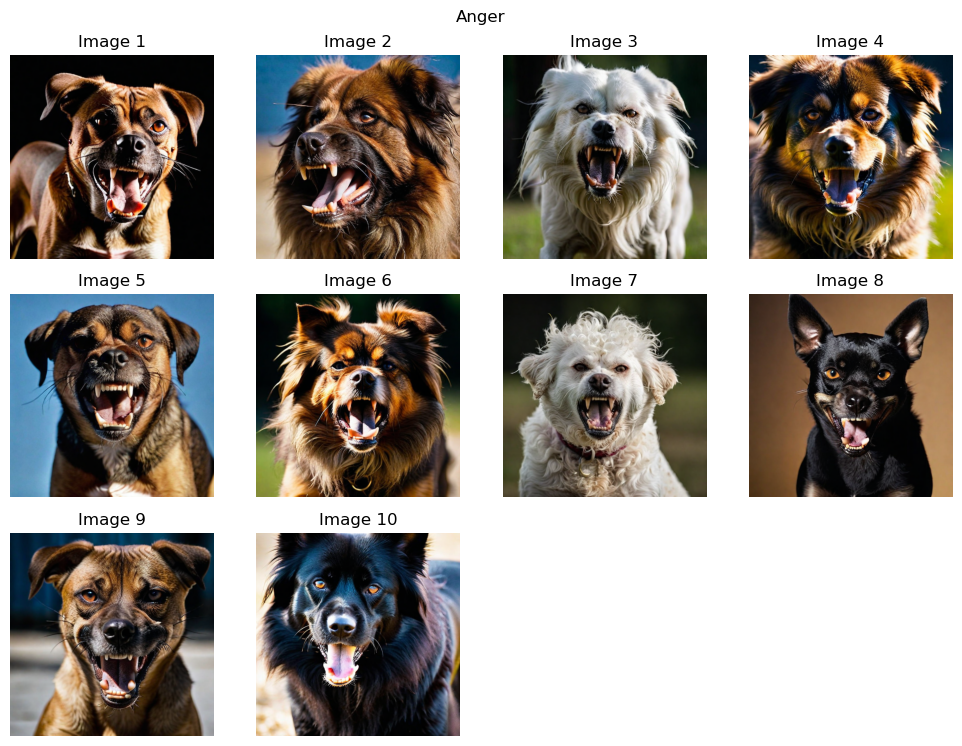

In [22]:
showImg('../data/images/anger', 10, title='Anger')

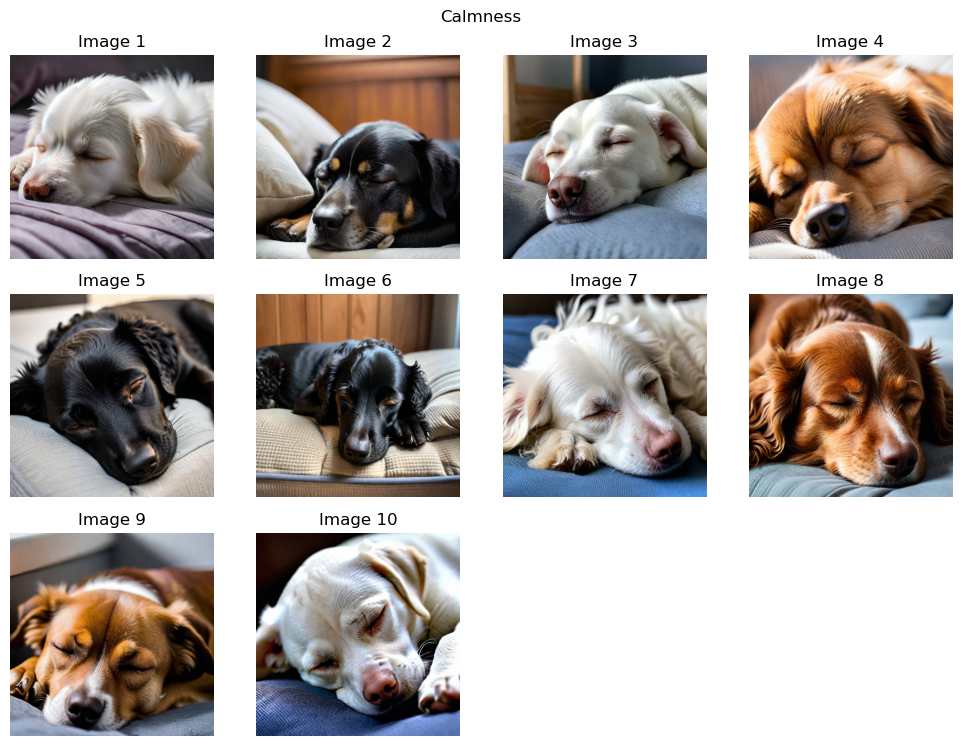

In [23]:
showImg('../data/images/calmness', 10, title='Calmness')

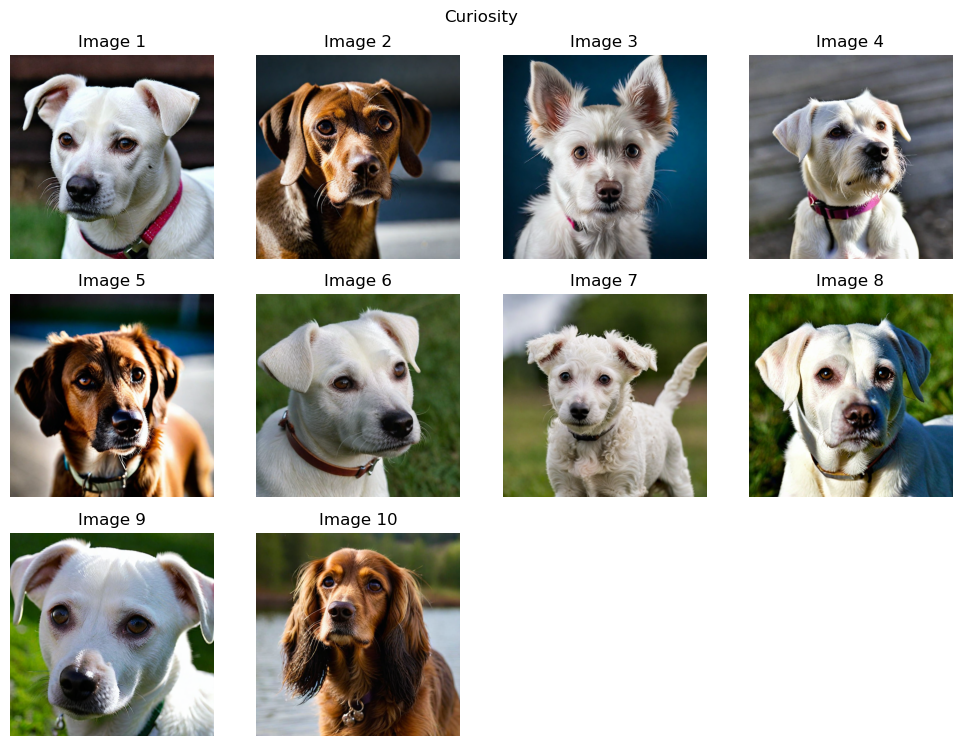

In [24]:
showImg('../data/images/curiosity', 10, title='Curiosity')

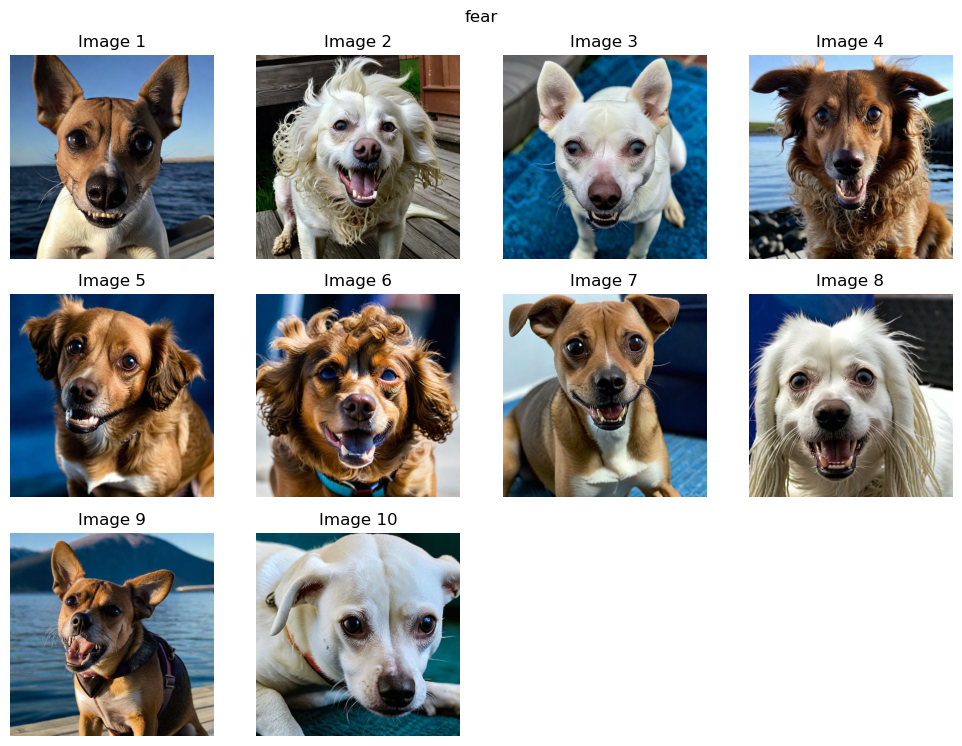

In [25]:
showImg('../data/images/fear', 10, title='fear')

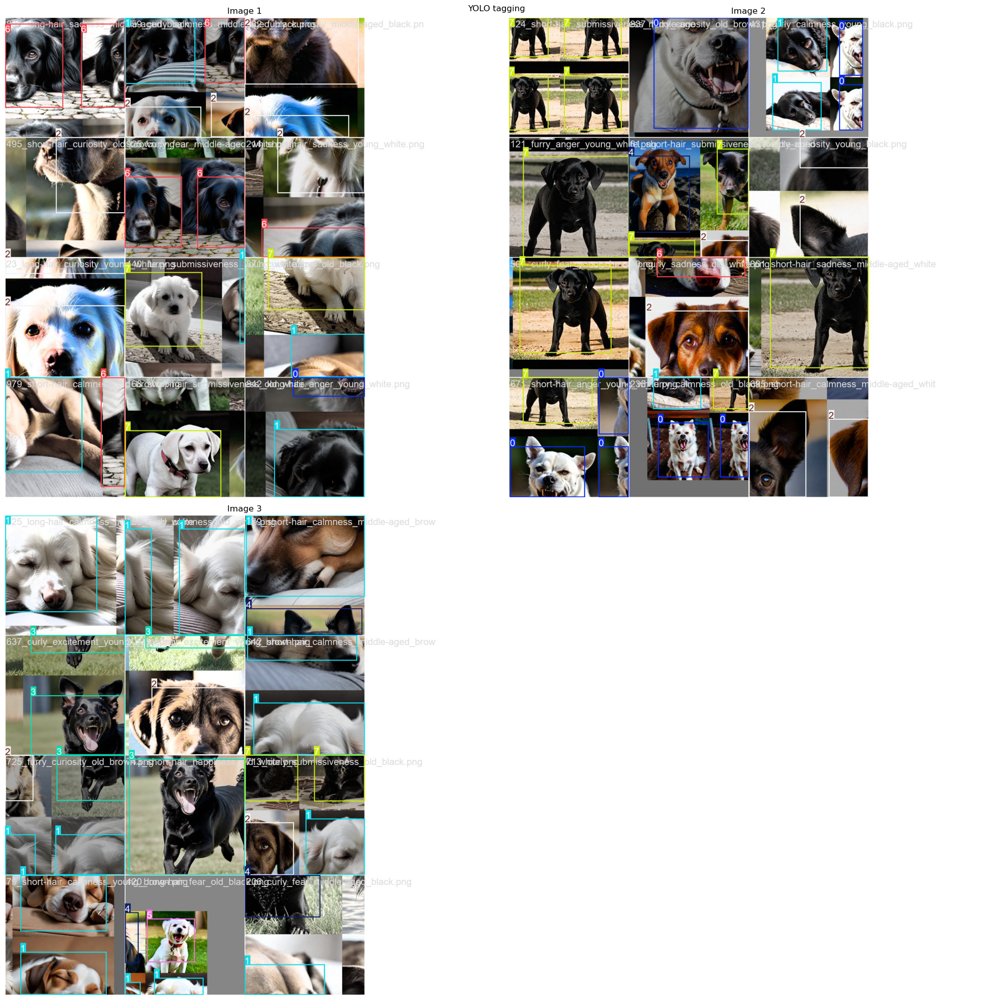

In [26]:
showImg('../data/batching_images', 3, title='YOLO tagging', figsize=(20, 20))

# Bonus Generating Negative Samples

In [ ]:
# Output directories
img_dir = "../negative_samples/images"
label_dir = "../negative_samples/labels"
os.makedirs(img_dir, exist_ok=True)
os.makedirs(label_dir, exist_ok=True)

# Prompts for diverse natural & indoor backgrounds
prompts = [
    "empty grassy field in summer",
    "city street with buildings but no people or animals",
    "snowy mountain landscape with clear sky",
    "empty living room with furniture",
    "forest floor with dappled light, no animals",
    "desert dunes under sunset sky",
    "empty kitchen, modern interior",
    "riverbank with rocks and vegetation, no people"
]

num_images = 1000

print("Generating background images...")
for i in range(num_images):
    prompt = prompts[i % len(prompts)]

    image = pipe(prompt,
        guidance_scale=7.5,
        height=640,
        width=640
     ).images[0]

    filename = f"bg_{i:03d}.jpg"
    image_path = os.path.join(img_dir, filename)
    label_path = os.path.join(label_dir, filename.replace(".jpg", ".txt"))

    image.save(image_path)
    open(label_path, "w").close()

    print(f"[✓] Saved: {filename}")

print("\n✅ All background images and empty label files created.")

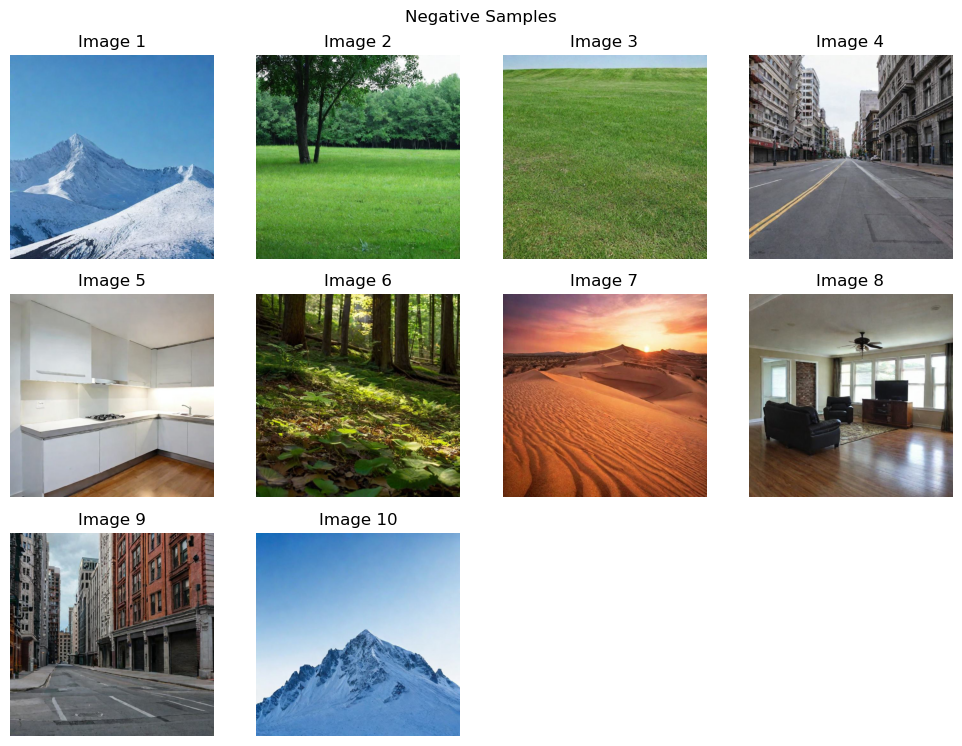

In [18]:
showImg('../data/negative_samples', 10, title='Negative Samples')